## Importing necessary libraries & dataset

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import make_scorer, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from imblearn.under_sampling import RandomUnderSampler

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.float_format', lambda x: '{:.2f}'.format(x))
np.set_printoptions(suppress=True)

In [6]:
# Loading train data and test data into a DataFrame

data_train = pd.read_csv("../Credit_card_datasets/credit_card_dataset_train.csv")

data_test = pd.read_csv("/Users/jayitachatterjee/Desktop/Defaulter_credit_card_prediction_ML/Credit_card_datasets/credit_card_dataset_test.csv")

In [7]:
# Display the first 5 rows of the train data to get an overview of the dataset
data_train.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,170000,2,2,1,52,0,0,0,0,0,...,163652,131396,130402,7620,6200,10000,5100,5500,5000,1
1,150000,2,2,1,39,1,-2,-2,-2,-2,...,0,0,0,0,0,0,0,0,0,1
2,120000,1,2,1,40,0,0,0,0,0,...,39510,40873,42082,2000,2000,2000,2000,2000,3000,0
3,270000,2,1,2,28,-1,-1,-1,-1,0,...,7931,3412,1035,845,9896,7977,17,1040,1848,0
4,50000,2,2,1,31,0,0,0,0,0,...,30929,30078,29170,1974,4406,1061,1073,1046,1047,1


In [8]:
# Display the first 5 rows of the test data to get an overview of the dataset
data_test.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,30000,1,2,1,25,-1,-1,-2,-1,2,...,25919,26383,25691,1389,0,25919,1000,0,19283,0
1,50000,2,3,1,51,-1,-1,-1,-1,-2,...,0,0,0,300,5880,0,0,0,0,1
2,330000,1,1,2,44,0,0,0,0,0,...,404157,370686,294348,19001,14000,12000,15000,7000,7000,0
3,460000,2,3,1,42,0,0,0,-2,-1,...,0,1619,3795,1600,1000,0,1619,3795,954,0
4,320000,1,2,2,29,0,0,0,0,0,...,322246,297637,301575,11650,12500,11900,10503,10886,10040,0


# Data Exploration

## Check all the columns

In [9]:
data_train.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month'],
      dtype='object')

In [10]:
data_test.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month'],
      dtype='object')

### Dataset information :

LIMIT_BAL: The credit limit granted to the client in New Taiwan (NT) dollars, including both individual and family/supplementary credit.

SEX: Gender of the client, encoded as 1 for male and 2 for female.

EDUCATION: Educational attainment of the client:
1: Graduate school
2: University
3: High school
4: Others
5 & 6: Unknown

MARRIAGE: Marital status of the client:
1: Married
2: Single
3: Others

AGE: Age of the client in years.

PAY_0 to PAY_6: Repayment status for the months from April to September 2005, with the following scale:
-1: Payment was made duly
1: Payment delayed by one month
2: Payment delayed by two months, and so forth up to...
8: Payment delayed by eight months
9: Payment delayed by nine months or more.

BILL_AMT1 to BILL_AMT6: Amount of the bill statement in NT dollars for the months from April to September 2005.

PAY_AMT1 to PAY_AMT6: Amount of the previous payment made by the client in NT dollars for the months from April to September 2005.

default.payment.next.month: Target variable indicating whether the client defaulted on payment the following month (1 = Yes, 0 = No).

## Rename the columns for better understanding

In [11]:
# Create a dictionary with the current column names as keys and the new names as values
column_renaming = {
    'LIMIT_BAL': 'Credit_Limit',
    'SEX': 'Gender',
    'EDUCATION': 'Education_Level',
    'MARRIAGE': 'Marital_Status',
    'AGE': 'Age',
    'PAY_0': 'Repayment_Status_Sept',
    'PAY_2': 'Repayment_Status_Aug',
    'PAY_3': 'Repayment_Status_July',
    'PAY_4': 'Repayment_Status_June',
    'PAY_5': 'Repayment_Status_May',
    'PAY_6': 'Repayment_Status_April',
    'BILL_AMT1': 'Bill_Statement_Sept',
    'BILL_AMT2': 'Bill_Statement_Aug',
    'BILL_AMT3': 'Bill_Statement_July',
    'BILL_AMT4': 'Bill_Statement_June',
    'BILL_AMT5': 'Bill_Statement_May',
    'BILL_AMT6': 'Bill_Statement_April',
    'PAY_AMT1': 'Previous_Payment_Sept',
    'PAY_AMT2': 'Previous_Payment_Aug',
    'PAY_AMT3': 'Previous_Payment_July',
    'PAY_AMT4': 'Previous_Payment_June',
    'PAY_AMT5': 'Previous_Payment_May',
    'PAY_AMT6': 'Previous_Payment_April',
    'default payment next month': 'Default_Payment_Next_Month'
}

# Rename the columns in the DataFrame
data_train.rename(columns=column_renaming, inplace=True)
data_test.rename(columns=column_renaming, inplace=True)


In [12]:
# Display the updated columns
print(data_train.columns)
print(data_test.columns)

Index(['Credit_Limit', 'Gender', 'Education_Level', 'Marital_Status', 'Age',
       'Repayment_Status_Sept', 'Repayment_Status_Aug',
       'Repayment_Status_July', 'Repayment_Status_June',
       'Repayment_Status_May', 'Repayment_Status_April', 'Bill_Statement_Sept',
       'Bill_Statement_Aug', 'Bill_Statement_July', 'Bill_Statement_June',
       'Bill_Statement_May', 'Bill_Statement_April', 'Previous_Payment_Sept',
       'Previous_Payment_Aug', 'Previous_Payment_July',
       'Previous_Payment_June', 'Previous_Payment_May',
       'Previous_Payment_April', 'Default_Payment_Next_Month'],
      dtype='object')
Index(['Credit_Limit', 'Gender', 'Education_Level', 'Marital_Status', 'Age',
       'Repayment_Status_Sept', 'Repayment_Status_Aug',
       'Repayment_Status_July', 'Repayment_Status_June',
       'Repayment_Status_May', 'Repayment_Status_April', 'Bill_Statement_Sept',
       'Bill_Statement_Aug', 'Bill_Statement_July', 'Bill_Statement_June',
       'Bill_Statement_May', 'Bill

## Check shape of the imported datasets

In [13]:
print(f"The training dataset for credit crad deafulter data has {data_train.shape[0]} data points and {data_train.shape[1]} features.")

The training dataset for credit crad deafulter data has 27000 data points and 24 features.


In [14]:
print(f"The test dataset for credit crad deafulter data has {data_test.shape[0]} data points and {data_test.shape[1]} features.")

The test dataset for credit crad deafulter data has 3000 data points and 24 features.


## Check for missing values

In [15]:
data_train.isnull().sum()

Credit_Limit                  0
Gender                        0
Education_Level               0
Marital_Status                0
Age                           0
Repayment_Status_Sept         0
Repayment_Status_Aug          0
Repayment_Status_July         0
Repayment_Status_June         0
Repayment_Status_May          0
Repayment_Status_April        0
Bill_Statement_Sept           0
Bill_Statement_Aug            0
Bill_Statement_July           0
Bill_Statement_June           0
Bill_Statement_May            0
Bill_Statement_April          0
Previous_Payment_Sept         0
Previous_Payment_Aug          0
Previous_Payment_July         0
Previous_Payment_June         0
Previous_Payment_May          0
Previous_Payment_April        0
Default_Payment_Next_Month    0
dtype: int64

In [16]:
data_test.isnull().sum()

Credit_Limit                  0
Gender                        0
Education_Level               0
Marital_Status                0
Age                           0
Repayment_Status_Sept         0
Repayment_Status_Aug          0
Repayment_Status_July         0
Repayment_Status_June         0
Repayment_Status_May          0
Repayment_Status_April        0
Bill_Statement_Sept           0
Bill_Statement_Aug            0
Bill_Statement_July           0
Bill_Statement_June           0
Bill_Statement_May            0
Bill_Statement_April          0
Previous_Payment_Sept         0
Previous_Payment_Aug          0
Previous_Payment_July         0
Previous_Payment_June         0
Previous_Payment_May          0
Previous_Payment_April        0
Default_Payment_Next_Month    0
dtype: int64

#### Insight :
No missing values are present

##To check duplicate records

In [17]:
data_test.duplicated().sum()

np.int64(1)

#### Insights :
No duplicate records are present.

## Analyze columns and required transformation


### Gender : 1 - Male ; 2 - Female

In [18]:
data_train['Gender'].value_counts()


Gender
2    16332
1    10668
Name: count, dtype: int64

In [19]:
data_test['Gender'].value_counts()

Gender
2    1780
1    1220
Name: count, dtype: int64

### Education_Level  1 = graduate school ; 2 = university ; 3 = high school ; 4 = others

In [20]:
data_train['Education_Level'].value_counts()

Education_Level
2    12596
1     9520
3     4464
5      248
4      115
6       47
0       10
Name: count, dtype: int64

In [21]:
data_test['Education_Level'].value_counts()

Education_Level
2    1434
1    1065
3     453
5      32
4       8
0       4
6       4
Name: count, dtype: int64

#### Insights :
The dataset contains values such as 5, 6, and 0 for certain columns that lack a specific description. These values can be grouped into the category "4," which represents "Others."

In [22]:
# Identify rows where 'Education_Level' is 5, 6, or 0
fill_edu = (data_train['Education_Level'] == 5) | (data_train['Education_Level'] == 6) | (data_train['Education_Level'] == 0)

# Update these rows to have the value 4, which represents 'Others'
data_train.loc[fill_edu , 'Education_Level'] = 4

# Count and display the occurrences of each unique value in the 'Education_Level' column
data_train['Education_Level'].value_counts()


Education_Level
2    12596
1     9520
3     4464
4      420
Name: count, dtype: int64

In [23]:
# Identify rows in the test dataset where 'Education_Level' is 5, 6, or 0
fill_edu = (data_test['Education_Level'] == 5) | (data_test['Education_Level'] == 6) | (data_test['Education_Level'] == 0)

# Update these rows to have the value 4, which represents 'Others'
data_test.loc[fill_edu , 'Education_Level'] = 4

# Count and display the occurrences of each unique value in the 'Education_Level' column of the test dataset
data_test['Education_Level'].value_counts()


Education_Level
2    1434
1    1065
3     453
4      48
Name: count, dtype: int64

### Marital_Statua : 1 = married ; 2 = single ; 3 = others

In [24]:
data_train['Marital_Status'].value_counts()

Marital_Status
2    14340
1    12328
3      285
0       47
Name: count, dtype: int64

In [25]:
data_test['Marital_Status'].value_counts()

Marital_Status
2    1624
1    1331
3      38
0       7
Name: count, dtype: int64

In [26]:
# Replacing 0 of marriage with 3(others) in train dataset

data_train['Marital_Status']=data_train['Marital_Status'].replace({0:3})

In [27]:
# Replacing 0 of marriage with 3(others) in test dataset
data_test['Marital_Status']=data_test['Marital_Status'].replace({0:3})

In [28]:
# Define the mapping of column names
repayment_columns = {
    'Repayment_Status_Sept': 'PAY_0',
    'Repayment_Status_Aug': 'PAY_2',
    'Repayment_Status_July': 'PAY_3',
    'Repayment_Status_June': 'PAY_4',
    'Repayment_Status_May': 'PAY_5',
    'Repayment_Status_April': 'PAY_6'
}

# Convert -1 (timely payment) to 0 in the repayment status columns
for new_col, old_col in repayment_columns.items():
    data_train[new_col] = data_train[new_col].replace(-1, 0)
    data_test[new_col] = data_test[new_col].replace(-1, 0)
    data_train[new_col] = data_train[new_col].replace(-2, -1)
    data_test[new_col] = data_test[new_col].replace(-2, -1)

#### Insights :


Timely payments, initially marked as -1 in the repayment status columns, were converted to 0, and -2 was converted to -1 to represent no consumption. These adjustments create a clearer and more intuitive scale for interpreting repayment behavior, improving the dataset's usability for analysis and modeling.

In [29]:
# Convert all negative 'Bill_Statement' values to zero
bill_columns = ['Bill_Statement_Sept', 'Bill_Statement_Aug', 'Bill_Statement_July', 'Bill_Statement_June', 'Bill_Statement_May', 'Bill_Statement_April']

# Replace negative values with zero in each of the bill statement columns
data_train[bill_columns] = data_train[bill_columns].clip(lower=0)
data_test[bill_columns] = data_test[bill_columns].clip(lower=0)



####Insights :
Negative values in the bill amount columns were converted to zero, as bill statements shouldn't have negative values.

In [30]:
data_train.Age.max()

np.int64(79)

In [31]:
data_train.Age.min()

np.int64(21)

## Describe statistics for numeric columns like Credit_Limit, Age, in the DataFrame

In [32]:
# Describe statistics for specific numeric columns
numeric_columns = ['Credit_Limit', 'Age']
data_train[numeric_columns].describe()


,Credit_Limit,Age
count,27000.00,27000.00
mean,167275.91,35.51
std,129681.97,9.25
min,10000.00,21.00
25%,50000.00,28.00
50%,140000.00,34.00
75%,240000.00,41.00
max,1000000.00,79.00


#### Insights :
Credit_Limit:

Mean: The average credit limit is approximately 167,276 NT dollars.
Range: Credit limits range from 10,000 NT dollars to 1,000,000 NT dollars.
Distribution: 50% of clients have a credit limit of 140,000 NT dollars or less, with a standard deviation of about 129,682 NT dollars, indicating variability in credit limits.

Age:

Mean: The average age of clients is about 35.5 years.
Range: Ages range from 21 to 79 years.
Distribution: 50% of clients are 34 years old or younger, with a standard deviation of 9.25 years, suggesting a relatively young client base.

## Plot Histogram plot and Box plot to check the data distribution

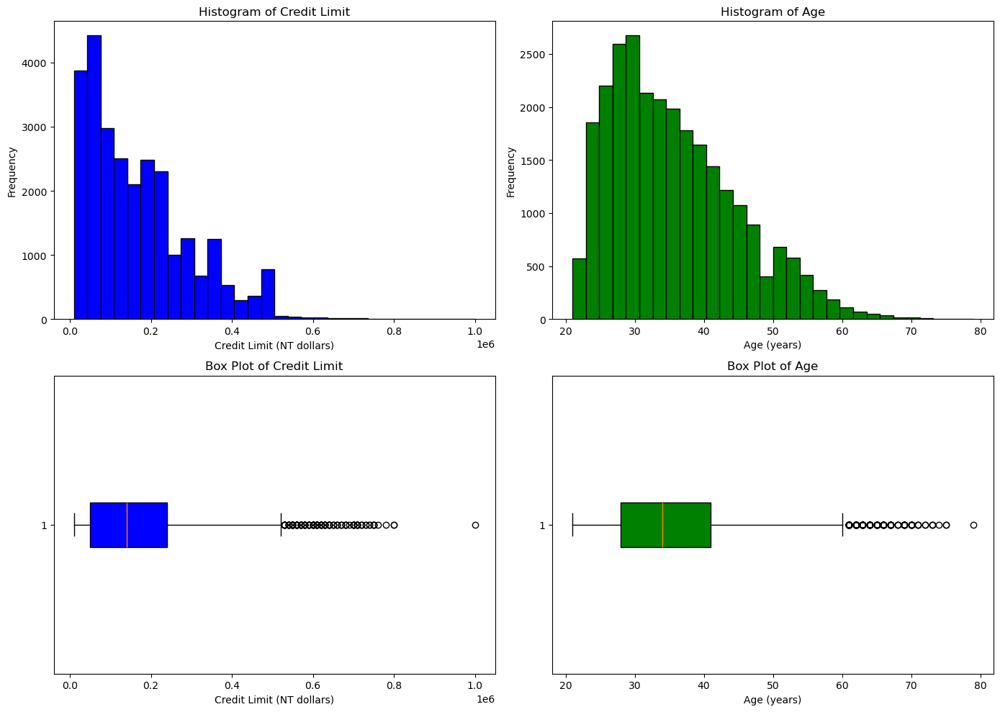

In [33]:
# Create a 2x2 grid of plots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Histogram for Credit_Limit
axes[0, 0].hist(data_train['Credit_Limit'], bins=30, color='blue', edgecolor='black')
axes[0, 0].set_title('Histogram of Credit Limit')
axes[0, 0].set_xlabel('Credit Limit (NT dollars)')
axes[0, 0].set_ylabel('Frequency')

# Histogram for Age
axes[0, 1].hist(data_train['Age'], bins=30, color='green', edgecolor='black')
axes[0, 1].set_title('Histogram of Age')
axes[0, 1].set_xlabel('Age (years)')
axes[0, 1].set_ylabel('Frequency')

# Box plot for Credit_Limit
axes[1, 0].boxplot(data_train['Credit_Limit'], vert=False, patch_artist=True, boxprops=dict(facecolor='blue'))
axes[1, 0].set_title('Box Plot of Credit Limit')
axes[1, 0].set_xlabel('Credit Limit (NT dollars)')

# Box plot for Age
axes[1, 1].boxplot(data_train['Age'], vert=False, patch_artist=True, boxprops=dict(facecolor='green'))
axes[1, 1].set_title('Box Plot of Age')
axes[1, 1].set_xlabel('Age (years)')

# Adjust layout
plt.tight_layout()
plt.show()


#### Insights :

Credit Limit:
The histogram shows a right-skewed distribution, with most clients having a credit limit between 0 and 200,000 NT dollars.
The box plot confirms the presence of outliers in the higher credit limit range, indicating a few clients have significantly higher credit limits compared to the majority.

Age:
The age distribution is more symmetrical, with most clients aged between 25 and 40 years.
The box plot shows a relatively even distribution of ages with some outliers, particularly in the older age groups (above 60 years).

/var/folders/s6/447vrd_n7rj8smn51pc92b1c0000gn/T/ipykernel_78538/2804068776.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data_train["Default_Payment_Next_Month"], palette=['#1f77b4', '#ff7f0e'], ax=axes[0])


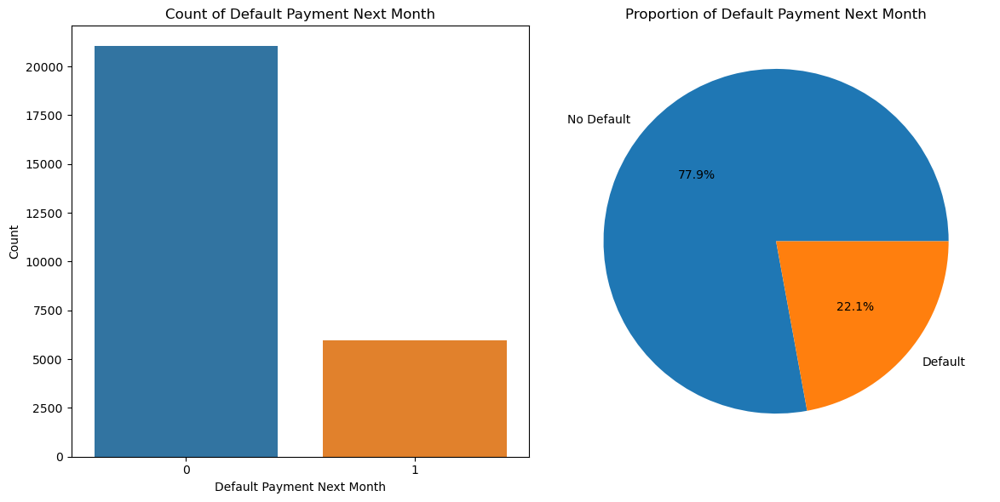

In [35]:
# Create a subplot with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the countplot in the first subplot
sns.countplot(x=data_train["Default_Payment_Next_Month"], palette=['#1f77b4', '#ff7f0e'], ax=axes[0])
axes[0].set_title('Count of Default Payment Next Month')
axes[0].set_xlabel('Default Payment Next Month')
axes[0].set_ylabel('Count')

# Create a pie chart in the second subplot
default_counts = data_train["Default_Payment_Next_Month"].value_counts()
labels = ['No Default', 'Default']

axes[1].pie(default_counts, labels=labels, autopct='%1.1f%%', colors=['#1f77b4', '#ff7f0e'])
axes[1].set_title('Proportion of Default Payment Next Month')

# Adjust layout
plt.tight_layout()
plt.show()



#### Insights :
The plot shows that 22.1% of clients defaulted, while 77.9% did not, indicating an imbalanced dataset with more non-default cases. This imbalance should be considered in any predictive modeling approach.

/var/folders/s6/447vrd_n7rj8smn51pc92b1c0000gn/T/ipykernel_78538/2703951168.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data_train["Gender"], palette=['#1f77b4', '#ff7f0e'], ax=axes[0])
/var/folders/s6/447vrd_n7rj8smn51pc92b1c0000gn/T/ipykernel_78538/2703951168.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Male', 'Female'])


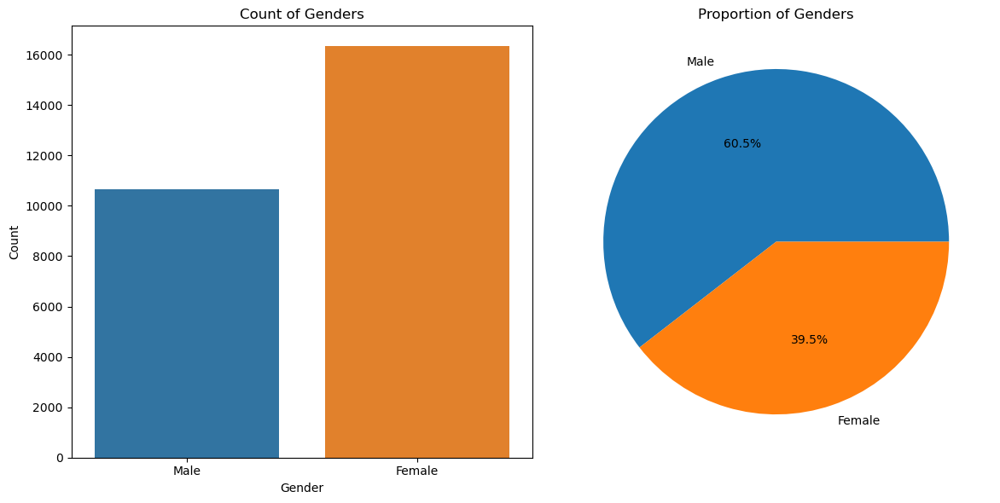

In [36]:
# Create a subplot with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the countplot in the first subplot
sns.countplot(x=data_train["Gender"], palette=['#1f77b4', '#ff7f0e'], ax=axes[0])
axes[0].set_title('Count of Genders')
axes[0].set_xlabel('Gender')
axes[0].set_ylabel('Count')
axes[0].set_xticklabels(['Male', 'Female'])

# Create a pie chart in the second subplot
gender_counts = data_train["Gender"].value_counts()
labels = ['Male', 'Female']

axes[1].pie(gender_counts, labels=labels, autopct='%1.1f%%', colors=['#1f77b4', '#ff7f0e'])
axes[1].set_title('Proportion of Genders')

# Adjust layout
plt.tight_layout()
plt.show()


#### Insights :
The dataset is skewed towards females, who make up 60.5% of the population, while males represent 39.5%.

/var/folders/s6/447vrd_n7rj8smn51pc92b1c0000gn/T/ipykernel_78538/3529347118.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data_train["Marital_Status"], palette=['#1f77b4', '#ff7f0e', '#2ca02c'], ax=axes[0])
/var/folders/s6/447vrd_n7rj8smn51pc92b1c0000gn/T/ipykernel_78538/3529347118.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Married', 'Single', 'Others'])


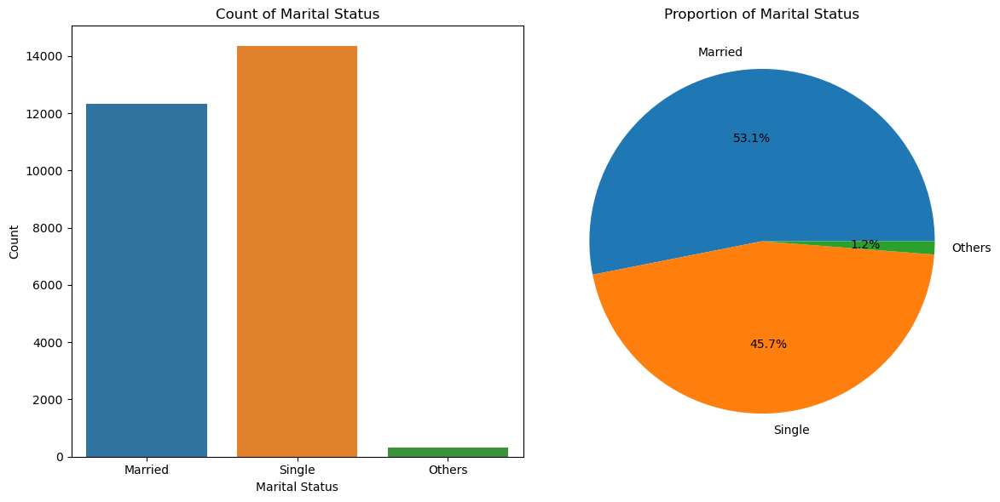

In [37]:

# Create a subplot with 1 row and 2 columns for Marital Status
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the countplot in the first subplot
sns.countplot(x=data_train["Marital_Status"], palette=['#1f77b4', '#ff7f0e', '#2ca02c'], ax=axes[0])
axes[0].set_title('Count of Marital Status')
axes[0].set_xlabel('Marital Status')
axes[0].set_ylabel('Count')
axes[0].set_xticklabels(['Married', 'Single', 'Others'])
# Create a pie chart in the second subplot
marital_counts = data_train["Marital_Status"].value_counts()
labels = ['Married', 'Single', 'Others']

axes[1].pie(marital_counts, labels=labels, autopct='%1.1f%%', colors=['#1f77b4', '#ff7f0e', '#2ca02c'])
axes[1].set_title('Proportion of Marital Status')

# Adjust layout
plt.tight_layout()
plt.show()


#### Insights :
Marital Status Distribution: The majority of clients in the dataset are married (53.1%), followed by single individuals (45.7%), with a small percentage (1.2%) categorized as "Others." This suggests that the dataset is fairly balanced between married and single clients, but with a slight majority of married individuals.

Proportion of Marital Status: The distribution of marital status indicates that married clients form the largest group, which may influence patterns in credit behavior and default rates in subsequent analysis.

/var/folders/s6/447vrd_n7rj8smn51pc92b1c0000gn/T/ipykernel_78538/2775877567.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data_train["Education_Level"], palette=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'], ax=axes[0])
/var/folders/s6/447vrd_n7rj8smn51pc92b1c0000gn/T/ipykernel_78538/2775877567.py:5: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  sns.countplot(x=data_train["Education_Level"], palette=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'], ax=axes[0])
/var/folders/s6/447vrd_n7rj8smn51pc92b1c0000gn/T/ipykernel_78538/2775877567.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Graduate School', 'University', 'High School', 'Others'])


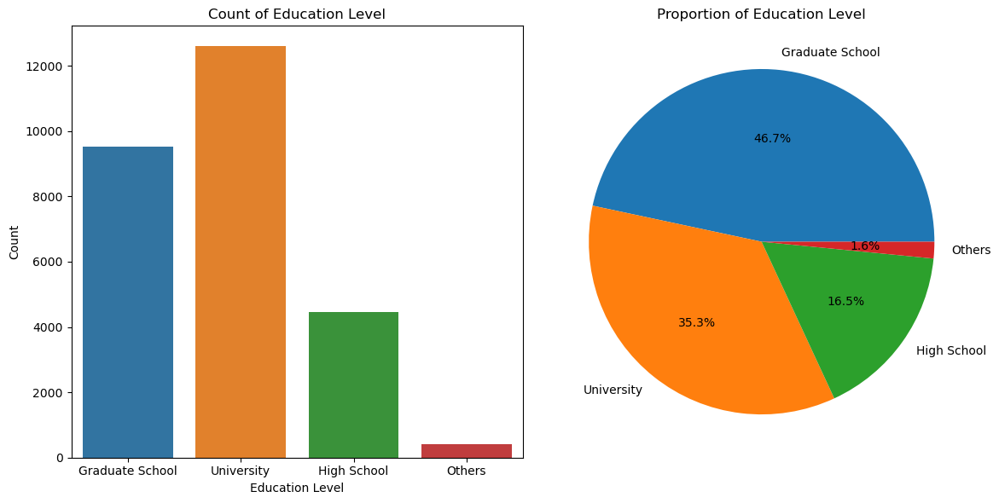

In [38]:
# Create a subplot with 1 row and 2 columns for Education Level
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the countplot in the first subplot
sns.countplot(x=data_train["Education_Level"], palette=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'], ax=axes[0])
axes[0].set_title('Count of Education Level')
axes[0].set_xlabel('Education Level')
axes[0].set_ylabel('Count')
axes[0].set_xticklabels(['Graduate School', 'University', 'High School', 'Others'])

# Create a pie chart in the second subplot
education_counts = data_train["Education_Level"].value_counts()
labels = ['Graduate School', 'University', 'High School', 'Others']

axes[1].pie(education_counts, labels=labels, autopct='%1.1f%%', colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'])
axes[1].set_title('Proportion of Education Level')

# Adjust layout
plt.tight_layout()
plt.show()


#### Insights :
Education Level Distribution: The majority of clients have a university education (46.7%), followed by graduate school (35.3%), and high school (16.5%). A small percentage (1.6%) falls into the "Others" category. This distribution shows a higher concentration of clients with advanced education levels, which could influence credit behavior and default risk.






/var/folders/s6/447vrd_n7rj8smn51pc92b1c0000gn/T/ipykernel_78538/4281228697.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data_train['Credit_Limit'], bins=bins, kde=False, palette=custom_colors, ax=axes[0])


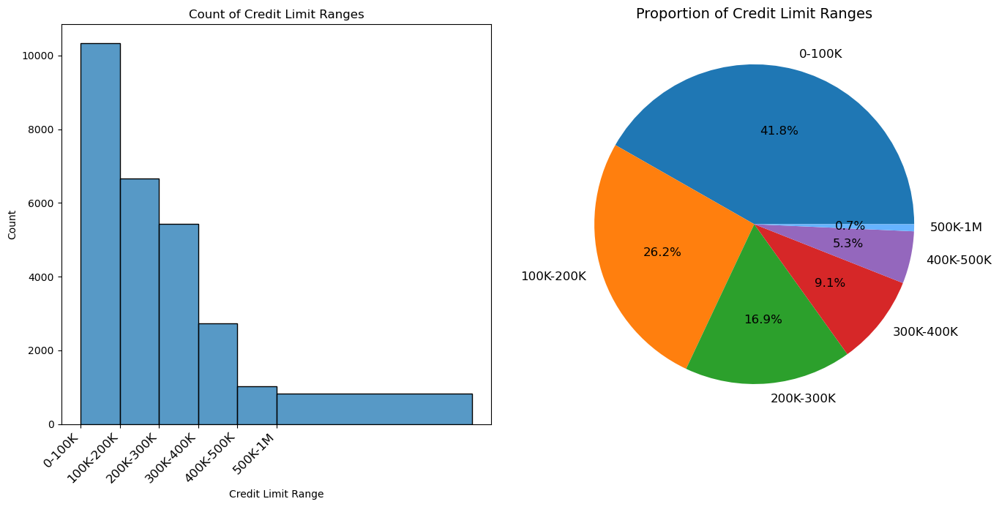

In [39]:
# Define bins and labels directly for plotting
bins = [0, 100000, 200000, 300000, 400000, 500000, 1000000]  # 6 intervals + 1 edge = 7 values
labels = ['0-100K', '100K-200K', '200K-300K', '300K-400K', '400K-500K', '500K-1M']  # 6 labels

# Define custom colors for the pie chart
custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#66b3ff']

# Create a subplot with 1 row and 2 columns for Credit Limit
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Plot the histogram for binned Credit Limit in the first subplot
sns.histplot(data_train['Credit_Limit'], bins=bins, kde=False, palette=custom_colors, ax=axes[0])
axes[0].set_title('Count of Credit Limit Ranges')
axes[0].set_xlabel('Credit Limit Range')
axes[0].set_ylabel('Count')

# Manually set x-tick labels to match the labels defined for the bins
axes[0].set_xticks(bins[:-1])  # Set the x-ticks to correspond to the start of each interval (excluding the last bin edge)
axes[0].set_xticklabels(labels, rotation=45, ha="right", fontsize=12)

# Calculate the counts for the pie chart
credit_limit_counts = pd.cut(data_train['Credit_Limit'], bins=bins, labels=labels, include_lowest=True).value_counts().sort_index()

# Create a pie chart in the second subplot with custom colors
axes[1].pie(credit_limit_counts, labels=credit_limit_counts.index, autopct='%1.1f%%', colors=custom_colors, textprops={'fontsize': 12})
axes[1].set_title('Proportion of Credit Limit Ranges', fontsize=14)

# Adjust layout
plt.tight_layout()
plt.show()


#### Insights : Most clients have credit limits in the 0-100K range (41.8%), with fewer clients in higher ranges, indicating a concentration of lower credit limits in the dataset.

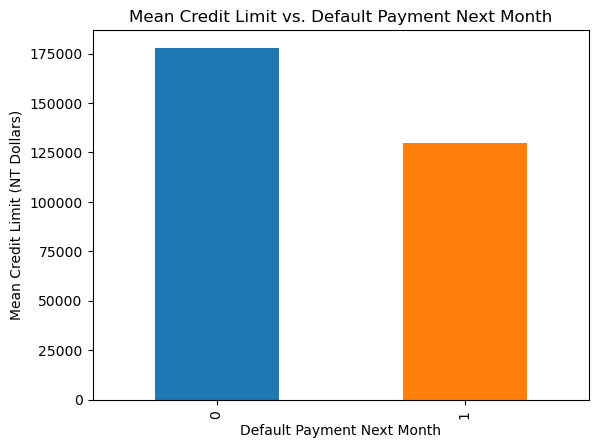

In [40]:
# Group by the target variable and calculate the mean Credit Limit
data_train.groupby('Default_Payment_Next_Month')['Credit_Limit'].mean().plot.bar(color=['#1f77b4', '#ff7f0e'])

# Set the title and labels
plt.title('Mean Credit Limit vs. Default Payment Next Month')
plt.xlabel('Default Payment Next Month')
plt.ylabel('Mean Credit Limit (NT Dollars)')

# Display the plot
plt.show()


#### Insights :

The plot shows that clients who did not default on their payment next month tend to have a higher average credit limit (around 175,000 NT dollars) compared to those who did default (around 125,000 NT dollars). This suggests that having a higher credit limit may be associated with a lower likelihood of default.

/Users/jayitachatterjee/Desktop/Defaulter_credit_card_prediction_ML/venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/jayitachatterjee/Desktop/Defaulter_credit_card_prediction_ML/venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/jayitachatterjee/Desktop/Defaulter_credit_card_prediction_ML/venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/jayitachatterjee/Desktop/Defaulter_credit_card_prediction_ML/venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/jayitachatterjee/Desktop/Defaulter_credit_car

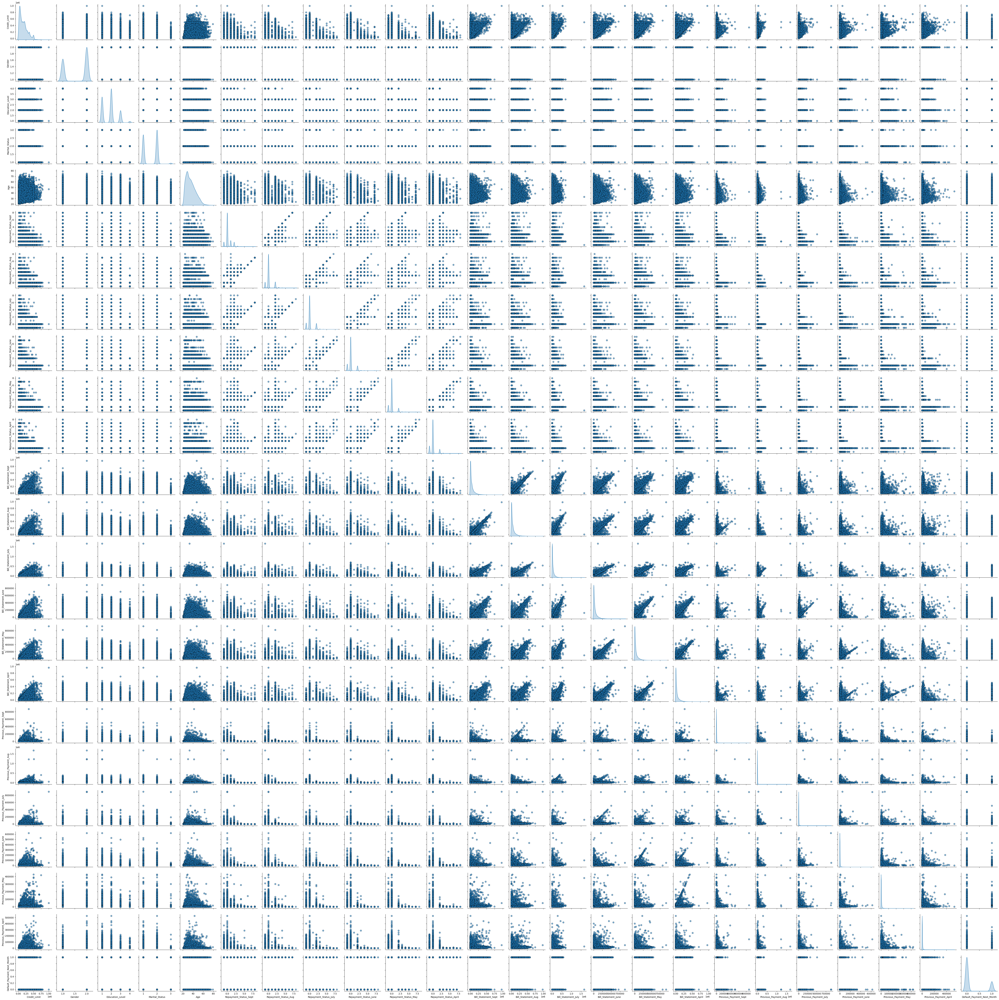

In [41]:
# Customize the appearance of the pairplot
pairplot = sns.pairplot(
    data_train,
    diag_kind='kde',
    plot_kws={'alpha': 0.6, 's': 50, 'edgecolor': 'k'},
    palette='Set2'
)

# Adjust the layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


#### Insights :
Based on the pair-plot above, it is evident that some relationships exist between the feature columns. To confirm these relationships, a correlation heatmap will be plotted.

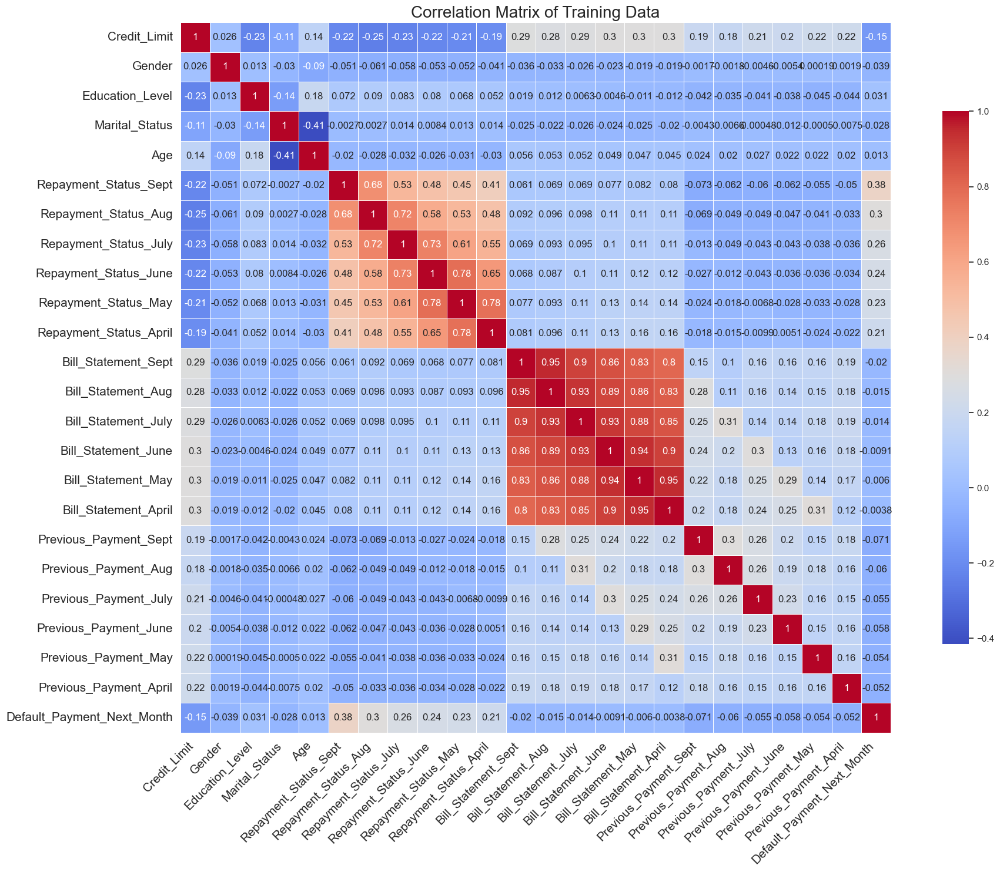

In [42]:
# Set the style of the visualization
sns.set(style="white")  # Sets a clean background style

# Set up the matplotlib figure with a larger size
plt.figure(figsize=(20, 15))

# Generate a heatmap to visualize the correlation matrix
heatmap = sns.heatmap(data_train.corr(),
                      annot=True,
                      cmap="coolwarm",
                      linewidths=0.5,
                      cbar_kws={"shrink": 0.75},
                      square=True,
                      annot_kws={"size": 12})

# Customize the title and labels
plt.title('Correlation Matrix of Training Data', fontsize=20)
plt.xticks(rotation=45, ha='right', fontsize=15)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=15)  # Set the y-axis labels size

# Add layout
plt.tight_layout()

# Show the plot
plt.show()


#### Insights :

The correlation heatmap reveals that there are some relationships between the feature columns, indicating they are not entirely independent. For example:


Repayment Status: There is a high correlation among the repayment status columns for different months. This is expected, as a customer who delays
payment in one month is likely to continue having issues in subsequent months.

Bill Amount: Similarly, the bill amount columns for different months are highly correlated. If a customer is unable to pay their bill, the outstanding amount is likely to remain high across multiple months.

While these correlations exist, dropping these columns would result in a significant loss of historical data related to payments and bill amounts, which are crucial for predicting defaults. Therefore, despite the correlation, it is advisable to retain all columns to preserve the information they provide.

# Model Training & Testing

## Split dataset into independent columns and dependent column

In [43]:
X_train = data_train.drop("Default_Payment_Next_Month", axis = 1)
y_train = data_train["Default_Payment_Next_Month"]
X_test =data_test.drop("Default_Payment_Next_Month", axis = 1)
y_test = data_test["Default_Payment_Next_Month"]

## Scalling the datasets

In [44]:
scaler = MinMaxScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

## Attempt 1 :

Base Model : Logistic Regression

Other Model : Support Vector Machine, RandomForest & XGB

No handling of class imbalance

### Base Model(Logistic Regression) train & test

In [45]:
base_model = LogisticRegression()
base_model.fit(X_train_scaled, y_train)
y_pred = base_model.predict(X_test_scaled)
base_model_report = classification_report(y_test, y_pred)
print(f"\nClassification Report for Logistic Regression:\n")
print(base_model_report)


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.83      0.96      0.89      2336
           1       0.70      0.29      0.41       664

    accuracy                           0.82      3000
   macro avg       0.76      0.63      0.65      3000
weighted avg       0.80      0.82      0.79      3000



#### Insights :
The Logistic Regression classifier shows good performance for the majority class (0) with a high F1-score of 0.89, but it struggles significantly with the minority class (1), achieving a much lower F1-score of 0.42. This indicates that the model is biased towards the majority class, reflecting an imbalance in how well the model generalizes across different classes.







### Plot of Feature Importance for Base Model

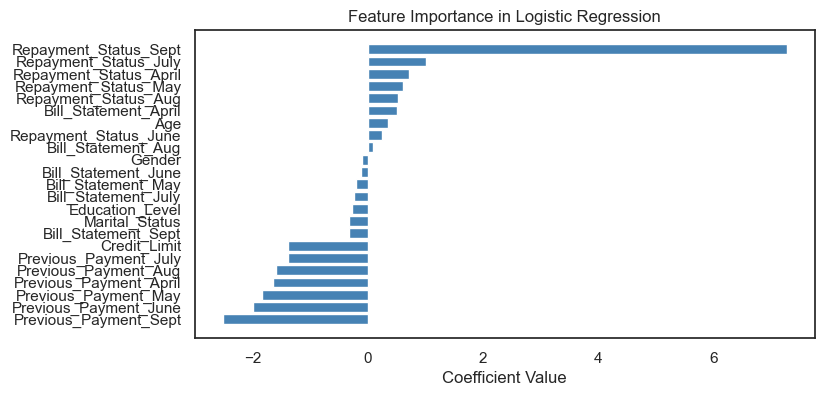

In [46]:
feature_importance = base_model.coef_[0]

# Create a DataFrame for easier handling
coef_df = pd.DataFrame(feature_importance, index=X_train_scaled.columns, columns=['Coefficients'])

# Sort the coefficients for better visualization
coef_df = coef_df.sort_values(by='Coefficients', ascending=True)

# Plotting
plt.figure(figsize=(8, 4))
plt.barh(coef_df.index, coef_df['Coefficients'], color='steelblue')
plt.xlabel('Coefficient Value')
plt.title('Feature Importance in Logistic Regression')
plt.show()

### Training , testing and feature importance plot for other models to see the performance

Training and evaluating Support Vector Machine...

Classification Report for Support Vector Machine:

              precision    recall  f1-score   support

           0       0.83      0.96      0.89      2336
           1       0.69      0.32      0.44       664

    accuracy                           0.82      3000
   macro avg       0.76      0.64      0.67      3000
weighted avg       0.80      0.82      0.79      3000

------------------------------------------------------------
Training and evaluating Random Forest...

Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.84      0.94      0.89      2336
           1       0.64      0.37      0.47       664

    accuracy                           0.81      3000
   macro avg       0.74      0.65      0.68      3000
weighted avg       0.80      0.81      0.79      3000

------------------------------------------------------------


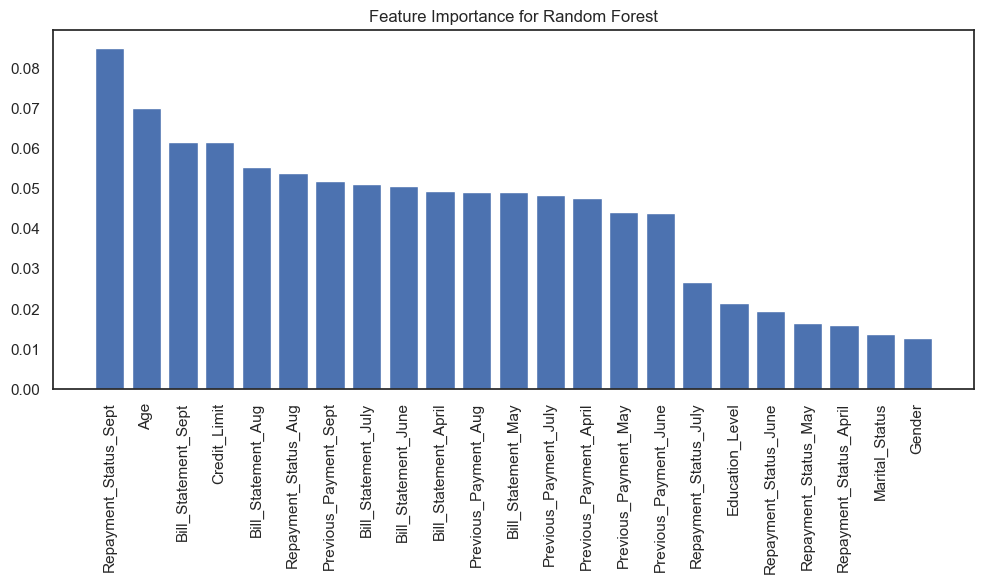

Training and evaluating XGBoost...


/Users/jayitachatterjee/Desktop/Defaulter_credit_card_prediction_ML/venv/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:05:57] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1722454143039/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.84      0.94      0.88      2336
           1       0.62      0.36      0.45       664

    accuracy                           0.81      3000
   macro avg       0.73      0.65      0.67      3000
weighted avg       0.79      0.81      0.79      3000

------------------------------------------------------------


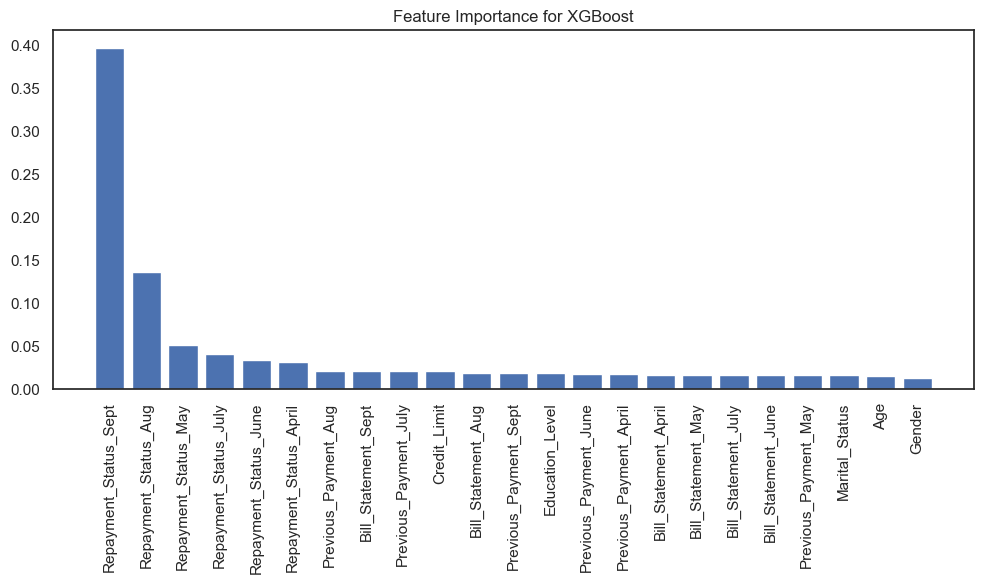

In [47]:
# Define the models to be tested
models = {
    'Support Vector Machine': SVC(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

for name, model in models.items():
    print(f"Training and evaluating {name}...")
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    report = classification_report(y_test, y_pred)
    print(f"\nClassification Report for {name}:\n")
    print(report)
    print("-" * 60)

  # Plotting feature importance
    if hasattr(model, "feature_importances_"):
        importance = model.feature_importances_
        indices = np.argsort(importance)[::-1]  # Sort features by importance

        plt.figure(figsize=(10, 6))
        plt.title(f"Feature Importance for {name}")
        plt.bar(range(X_train_scaled.shape[1]), importance[indices], align="center")
        plt.xticks(range(X_train_scaled.shape[1]), X_train_scaled.columns[indices], rotation=90)
        plt.tight_layout()
        plt.show()


#### Insights :
Support Vector Classifier:

Class 0: F1-score of 0.89, indicating strong performance.

Class 1: F1-score of 0.44, showing weaker performance.

Conclusion: The model is biased towards the majority class (0) with a significant drop in performance for the minority class (1).

Random Forest:

Class 0: F1-score of 0.89, indicating good performance.

Class 1: F1-score of 0.45, slightly better but still indicating bias towards the majority class.

Conclusion: The model performs similarly to the Support Vector Classifier, with better recall but still struggles with the minority class.

XGBoost:

Class 0: F1-score of 0.88, also showing strong performance.

Class 1: F1-score of 0.45, on par with Random Forest.

XGBoost performs similarly to Random Forest, with a bias towards the majority class and difficulty in classifying the minority class.
All three models demonstrate a bias towards the majority class (0) with stronger F1-scores, while they struggle with the minority class (1), as reflected by the lower F1-scores.







## Attempt 2
Handle Class Imbalance Using Under Sampling

In [48]:


rus = RandomUnderSampler(random_state=42)
X_train_res, y_train_res = rus.fit_resample(X_train_scaled, y_train)
y_train_res.value_counts()

Default_Payment_Next_Month
0    5972
1    5972
Name: count, dtype: int64

In [49]:
lr_model = LogisticRegression()
lr_model .fit(X_train_res, y_train_res)
y_lr_pred = lr_model .predict(X_test_scaled)
lr_report = classification_report(y_test, y_lr_pred)
print(f"\nClassification Report for Logistic Regression:\n")
print(lr_report)


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      2336
           1       0.48      0.56      0.51       664

    accuracy                           0.77      3000
   macro avg       0.67      0.69      0.68      3000
weighted avg       0.78      0.77      0.77      3000



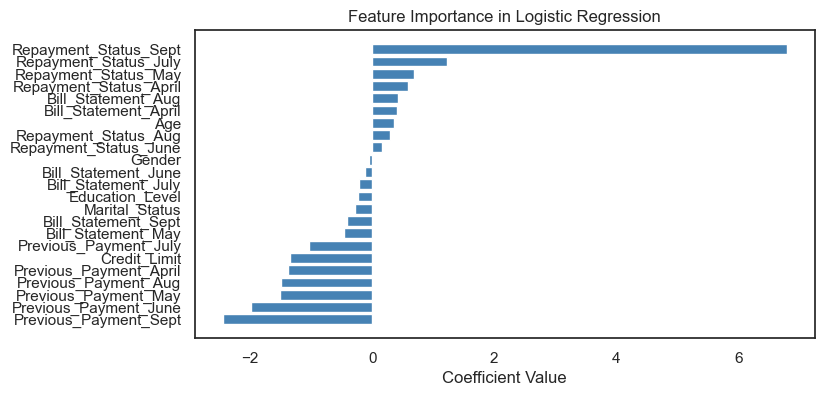

In [50]:
feature_importance = lr_model.coef_[0]

# Create a DataFrame for easier handling
coef_df = pd.DataFrame(feature_importance, index=X_train_res.columns, columns=['Coefficients'])

# Sort the coefficients for better visualization
coef_df = coef_df.sort_values(by='Coefficients', ascending=True)

# Plotting
plt.figure(figsize=(8, 4))
plt.barh(coef_df.index, coef_df['Coefficients'], color='steelblue')
plt.xlabel('Coefficient Value')
plt.title('Feature Importance in Logistic Regression')
plt.show()

Training and evaluating Support Vector Machine...

Classification Report for Support Vector Machine:

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      2336
           1       0.49      0.56      0.52       664

    accuracy                           0.77      3000
   macro avg       0.68      0.70      0.69      3000
weighted avg       0.79      0.77      0.78      3000

------------------------------------------------------------
Training and evaluating Random Forest...

Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.88      0.77      0.82      2336
           1       0.43      0.63      0.51       664

    accuracy                           0.74      3000
   macro avg       0.66      0.70      0.67      3000
weighted avg       0.78      0.74      0.75      3000

------------------------------------------------------------


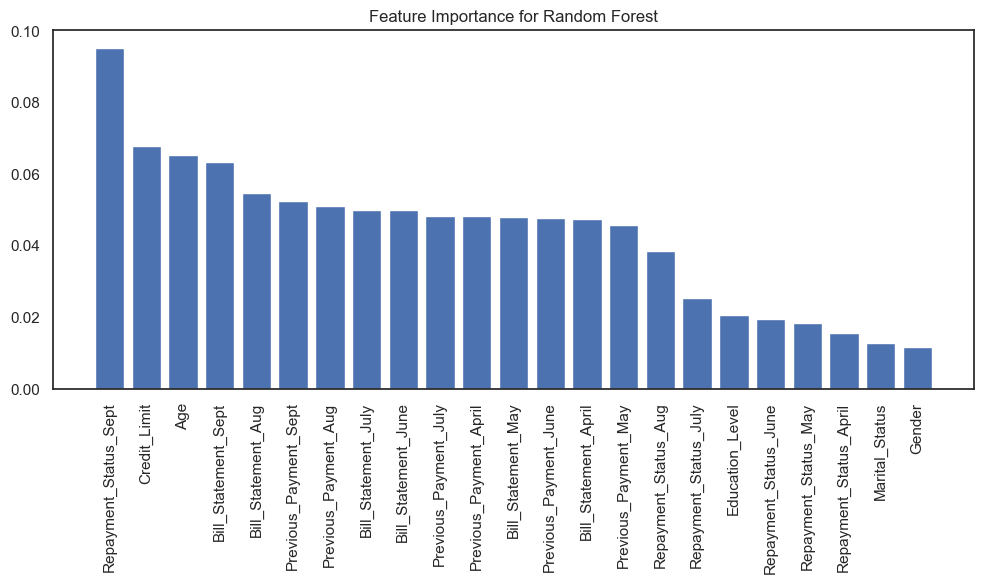

Training and evaluating XGBoost...


/Users/jayitachatterjee/Desktop/Defaulter_credit_card_prediction_ML/venv/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:06:19] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1722454143039/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.89      0.71      0.79      2336
           1       0.40      0.68      0.51       664

    accuracy                           0.71      3000
   macro avg       0.65      0.70      0.65      3000
weighted avg       0.78      0.71      0.73      3000

------------------------------------------------------------


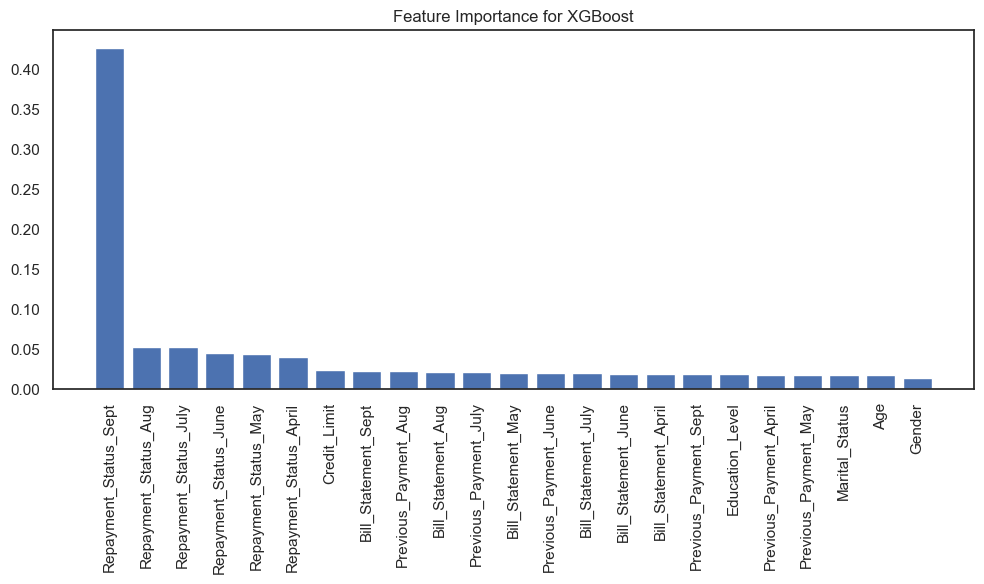

In [51]:
# Define the models to be tested
models = {
    'Support Vector Machine': SVC(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

# Assume X_train_scaled, y_train, X_test_scaled, y_test are already defined
for name, model in models.items():
    print(f"Training and evaluating {name}...")
    model.fit(X_train_res, y_train_res)
    y_pred = model.predict(X_test_scaled)
    report = classification_report(y_test, y_pred)
    print(f"\nClassification Report for {name}:\n")
    print(report)
    print("-" * 60)

  # Plotting feature importance
    if hasattr(model, "feature_importances_"):
        importance = model.feature_importances_
        indices = np.argsort(importance)[::-1]  # Sort features by importance

        plt.figure(figsize=(10, 6))
        plt.title(f"Feature Importance for {name}")
        plt.bar(range(X_train_res.shape[1]), importance[indices], align="center")
        plt.xticks(range(X_train_res.shape[1]), X_train_res.columns[indices], rotation=90)
        plt.tight_layout()
        plt.show()


#### Insights :
under-sampling has successfully improved recall for the minority class across different models, which is beneficial for scenarios where capturing all positives is more critical than minimizing false positives

In [52]:
!pip install optuna


  Using cached MarkupSafe-2.1.5-cp312-cp312-macosx_10_9_x86_64.whl.metadata (3.0 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 4.4 MB/s eta 0:00:00a 0:00:01
Using cached MarkupSafe-2.1.5-cp312-cp312-macosx_10_9_x86_64.whl (14 kB)


In [54]:
import optuna
# Define the objective function for Optuna
def objective(trial):
    param = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'verbosity': 0,
        'booster': 'gbtree',
        'lambda': trial.suggest_float('lambda', 1e-3, 10.0, log=True),
        'alpha': trial.suggest_float('alpha', 1e-3, 10.0, log=True),
        'subsample': trial.suggest_float('subsample', 0.4, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1.0),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'eta': trial.suggest_float('eta', 0.01, 0.3),
        'gamma': trial.suggest_float('gamma', 0, 10),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'max_delta_step': trial.suggest_int('max_delta_step', 0, 10)
    }

    model = XGBClassifier(**param)

    # Calculate the cross-validated f1_score
    f1_scorer = make_scorer(f1_score, average='macro')
    scores = cross_val_score(model, X_train_res, y_train_res, cv=3, scoring=f1_scorer, n_jobs=-1)

    return np.mean(scores)

study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective, n_trials=50)

/Users/jayitachatterjee/Desktop/Defaulter_credit_card_prediction_ML/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[I 2024-08-13 23:07:38,549] A new study created in memory with name: no-name-aa9f4a52-6bdc-46f8-9246-ccc7d12ccaac
[I 2024-08-13 23:07:42,477] Trial 0 finished with value: 0.4626880778161273 and parameters: {'lambda': 0.003699998349644934, 'alpha': 3.334796486995111, 'subsample': 0.8449053638763141, 'colsample_bytree': 0.8520646885544407, 'max_depth': 7, 'eta': 0.09655799461170049, 'gamma': 5.966885944135273, 'scale_pos_weight': 7.845085154630757, 'min_child_weight': 5, 'max_delta_step': 6}. Best is trial 0 with value: 0.4626880778161273.
[I 2024-08-13 23:07:43,401] Trial 1 finished with value: 0.5490048989185561 and parameters: {'lambda': 0.001426054278379745, 'alpha': 0.8850408263124

In [55]:
print('Best trial:')
trial = study_xgb.best_trial
print('  F1-score: {}'.format(trial.value))
print('  Params: ')
for key, value in trial.params.items():
    print('    {}: {}'.format(key, value))

best_params = study_xgb.best_params
best_model_xgb = XGBClassifier(**best_params)
best_model_xgb.fit(X_train_res, y_train_res)

# Evaluate on the test set
y_pred = best_model_xgb.predict(X_test_scaled)

report = classification_report(y_test, y_pred)
print(report)

Best trial:
  F1-score: 0.7068950113569481
  Params: 
    lambda: 0.08938443614895508
    alpha: 0.04055278335879611
    subsample: 0.5731748357633233
    colsample_bytree: 0.6390376630983707
    max_depth: 9
    eta: 0.23870708066174315
    gamma: 8.355375402463137
    scale_pos_weight: 1.0525916293604591
    min_child_weight: 7
    max_delta_step: 2
              precision    recall  f1-score   support

           0       0.89      0.76      0.82      2336
           1       0.43      0.66      0.53       664

    accuracy                           0.73      3000
   macro avg       0.66      0.71      0.67      3000
weighted avg       0.79      0.73      0.75      3000



## Attempt 3
Handle Class Imbalance Using SMOTE Tomek


In [56]:
from imblearn.combine import SMOTETomek

smt = SMOTETomek(random_state=42)
X_train_smt, y_train_smt = smt.fit_resample(X_train_scaled, y_train)
y_train_smt.value_counts()

Default_Payment_Next_Month
1    20259
0    20259
Name: count, dtype: int64

In [57]:
model = LogisticRegression()
model.fit(X_train_smt, y_train_smt)
y_pred = model.predict(X_test_scaled)
report = classification_report(y_test, y_pred)
print(f"\nClassification Report for Logistic Regression:\n")
print(report)


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.87      0.82      0.84      2336
           1       0.47      0.57      0.51       664

    accuracy                           0.76      3000
   macro avg       0.67      0.69      0.68      3000
weighted avg       0.78      0.76      0.77      3000



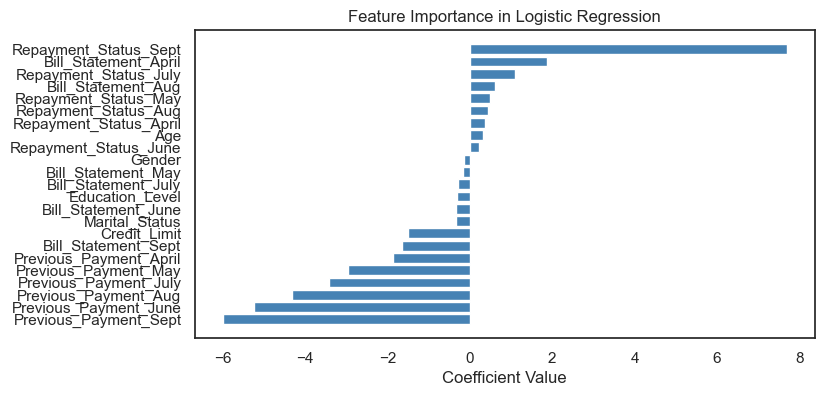

In [58]:
feature_importance = model.coef_[0]

# Create a DataFrame for easier handling
coef_df = pd.DataFrame(feature_importance, index=X_train_smt.columns, columns=['Coefficients'])

# Sort the coefficients for better visualization
coef_df = coef_df.sort_values(by='Coefficients', ascending=True)

# Plotting
plt.figure(figsize=(8, 4))
plt.barh(coef_df.index, coef_df['Coefficients'], color='steelblue')
plt.xlabel('Coefficient Value')
plt.title('Feature Importance in Logistic Regression')
plt.show()

Training and evaluating Support Vector Machine...

Classification Report for Support Vector Machine:

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      2336
           1       0.48      0.57      0.52       664

    accuracy                           0.77      3000
   macro avg       0.68      0.70      0.69      3000
weighted avg       0.79      0.77      0.78      3000

------------------------------------------------------------
Training and evaluating Random Forest...

Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.85      0.88      0.87      2336
           1       0.53      0.47      0.50       664

    accuracy                           0.79      3000
   macro avg       0.69      0.68      0.68      3000
weighted avg       0.78      0.79      0.79      3000

------------------------------------------------------------


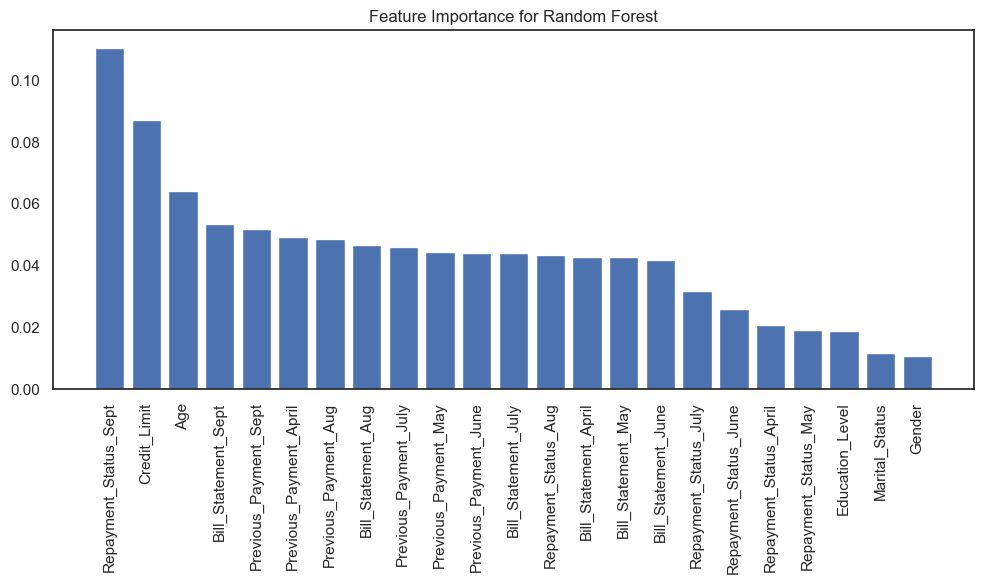

Training and evaluating XGBoost...


/Users/jayitachatterjee/Desktop/Defaulter_credit_card_prediction_ML/venv/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:09:33] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1722454143039/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.84      0.90      0.87      2336
           1       0.54      0.40      0.46       664

    accuracy                           0.79      3000
   macro avg       0.69      0.65      0.66      3000
weighted avg       0.77      0.79      0.78      3000

------------------------------------------------------------


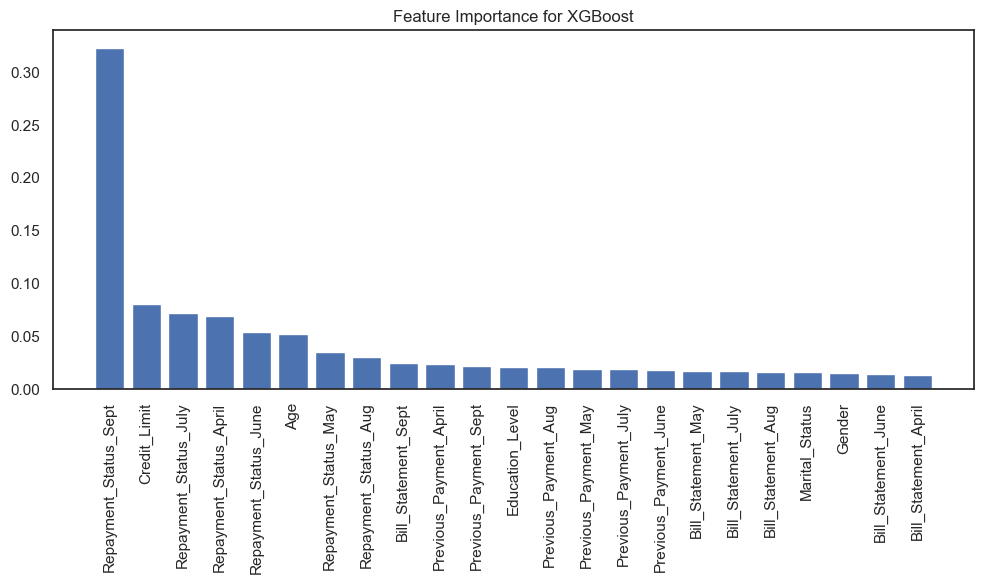

In [59]:
# Define the models to be tested
models = {
    'Support Vector Machine': SVC(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

# Assume X_train_scaled, y_train, X_test_scaled, y_test are already defined
for name, model in models.items():
    print(f"Training and evaluating {name}...")
    model.fit(X_train_smt, y_train_smt)
    y_pred = model.predict(X_test_scaled)
    report = classification_report(y_test, y_pred)
    print(f"\nClassification Report for {name}:\n")
    print(report)
    print("-" * 60)

  # Plotting feature importance
    if hasattr(model, "feature_importances_"):
        importance = model.feature_importances_
        indices = np.argsort(importance)[::-1]  # Sort features by importance

        plt.figure(figsize=(10, 6))
        plt.title(f"Feature Importance for {name}")
        plt.bar(range(X_train_smt.shape[1]), importance[indices], align="center")
        plt.xticks(range(X_train_smt.shape[1]), X_train_smt.columns[indices], rotation=90)
        plt.tight_layout()
        plt.show()

#### Insights :
Using SMOTE didn’t effectively increase recall in your case because it might have introduced noise or overlapping examples between classes. As a result, you're opting for under-sampling to better focus the model on the minority class. Under-sampling reduces the dominance of the majority class, allowing the model to identify more true positives in the minority class, thus increasing recall. This approach is beneficial when the priority is to capture more instances of the minority class, even if it means potentially increasing false positives.

## Model Evaluation : ROC/AUC

In [60]:
print(base_model_report)

              precision    recall  f1-score   support

           0       0.83      0.96      0.89      2336
           1       0.70      0.29      0.41       664

    accuracy                           0.82      3000
   macro avg       0.76      0.63      0.65      3000
weighted avg       0.80      0.82      0.79      3000



In [61]:
probabilities_base_model =base_model.predict_proba(X_test_scaled)[:,1]
fpr_base_model, tpr_base_model, thresholds = roc_curve(y_test, probabilities_base_model)


fpr_base_model[:5], tpr_base_model[:5], thresholds[:5]

(array([0.        , 0.        , 0.00085616, 0.00085616, 0.00128425]),
 array([0.        , 0.00150602, 0.00150602, 0.00753012, 0.00753012]),
 array([       inf, 0.99890138, 0.99869923, 0.9753011 , 0.9748349 ]))

In [62]:
area_base_model = auc(fpr_base_model, tpr_base_model)
area_base_model

np.float64(0.7473080463979206)

In [63]:
y_pred = best_model_xgb.predict(X_test_scaled)
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.89      0.76      0.82      2336
           1       0.43      0.66      0.53       664

    accuracy                           0.73      3000
   macro avg       0.66      0.71      0.67      3000
weighted avg       0.79      0.73      0.75      3000



In [64]:
probabilities_best_model = best_model_xgb.predict_proba(X_test_scaled)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, probabilities_best_model)

fpr[:5], tpr[:5], thresholds[:5]

(array([0.        , 0.        , 0.        , 0.00042808, 0.00128425]),
 array([0.        , 0.00150602, 0.00301205, 0.00301205, 0.00451807]),
 array([       inf, 0.94451606, 0.9427605 , 0.9416114 , 0.9407436 ],
       dtype=float32))

In [65]:
area_best_model = auc(fpr, tpr)
area_best_model

np.float64(0.7727302618006272)

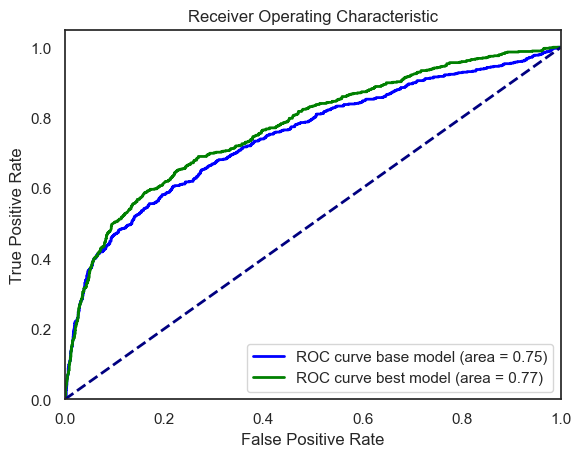

In [66]:
plt.figure()
# Change the color for the base model ROC curve
plt.plot(fpr_base_model, tpr_base_model, color='blue', lw=2, label='ROC curve base model (area = %0.2f)' % area_base_model)

# Change the color for the best model ROC curve
plt.plot(fpr, tpr, color='green', lw=2, label='ROC curve best model (area = %0.2f)' % area_best_model)

# The diagonal line for a random classifier
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


#### Insights :

The ROC curves show that the best model (green curve) has a slightly higher AUC (0.77) compared to the base model (blue curve, AUC = 0.75). This indicates that the best model has a marginally better overall performance in distinguishing between the positive and negative classes.

Recall Focus:

Increase in Recall: The best model's ROC curve is higher in the top-left portion of the plot, suggesting that it has better recall (true positive rate) at various thresholds compared to the base model. This aligns with your goal to increase recall.

Moderate Improvement: The improvement in AUC and recall is modest but positive, indicating that the changes made to the model have successfully enhanced its ability to correctly identify the positive class.

## Model Evaluation : Rankordering, KS statistic, Gini coeff

In [68]:
probabilities = best_model_xgb.predict_proba(X_test_scaled)[:,1]

df_eval = pd.DataFrame({
    'Default Truth': y_test,
    'Default Probability': probabilities
})
df_eval.head(3)

,Default Truth,Default Probability
0,0,0.67
1,1,0.48
2,0,0.51


In [69]:
df_eval['Decile'] = pd.qcut(df_eval['Default Probability'], 8, labels=False, duplicates='drop')
df_eval.head(3)

,Default Truth,Default Probability,Decile
0,0,0.67,6
1,1,0.48,5
2,0,0.51,5


In [70]:
df_eval[df_eval.Decile==7]['Default Probability'].describe()

count   375.00
mean      0.87
std       0.05
min       0.76
25%       0.83
50%       0.89
75%       0.92
max       0.94
Name: Default Probability, dtype: float64

In [71]:
df_decile = df_eval.groupby('Decile').apply(lambda x: pd.Series({
    'Minimum Probability': x['Default Probability'].min(),
    'Maximum Probability': x['Default Probability'].max(),
    'Events': x['Default Truth'].sum(),
    'Non-events': x['Default Truth'].count() - x['Default Truth'].sum(),
}))
df_decile.reset_index(inplace=True)
df_decile

/var/folders/s6/447vrd_n7rj8smn51pc92b1c0000gn/T/ipykernel_78538/482895170.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_decile = df_eval.groupby('Decile').apply(lambda x: pd.Series({


,Decile,Minimum Probability,Maximum Probability,Events,Non-events
0,0,0.07,0.21,20.00,360.00
1,1,0.21,0.28,32.00,340.00
2,2,0.28,0.34,42.00,331.00
3,3,0.34,0.39,58.00,317.00
4,4,0.39,0.47,53.00,322.00
5,5,0.47,0.58,75.00,300.00
6,6,0.58,0.76,134.00,241.00
7,7,0.76,0.94,250.00,125.00


In [72]:
df_decile['Event Rate'] = df_decile['Events']*100 / (df_decile['Events']+df_decile['Non-events'])
df_decile['Non-event Rate'] = df_decile['Non-events']*100 / (df_decile['Events']+df_decile['Non-events'])
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events,Event Rate,Non-event Rate
0,0,0.07,0.21,20.00,360.00,5.26,94.74
1,1,0.21,0.28,32.00,340.00,8.60,91.40
2,2,0.28,0.34,42.00,331.00,11.26,88.74
3,3,0.34,0.39,58.00,317.00,15.47,84.53
4,4,0.39,0.47,53.00,322.00,14.13,85.87
5,5,0.47,0.58,75.00,300.00,20.00,80.00
6,6,0.58,0.76,134.00,241.00,35.73,64.27
7,7,0.76,0.94,250.00,125.00,66.67,33.33


In [73]:
df_decile = df_decile.sort_values(by='Decile', ascending=False).reset_index(drop=True)
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events,Event Rate,Non-event Rate
0,7,0.76,0.94,250.00,125.00,66.67,33.33
1,6,0.58,0.76,134.00,241.00,35.73,64.27
2,5,0.47,0.58,75.00,300.00,20.00,80.00
3,4,0.39,0.47,53.00,322.00,14.13,85.87
4,3,0.34,0.39,58.00,317.00,15.47,84.53
5,2,0.28,0.34,42.00,331.00,11.26,88.74
6,1,0.21,0.28,32.00,340.00,8.60,91.40
7,0,0.07,0.21,20.00,360.00,5.26,94.74


In [74]:
df_decile['Cum Events'] =  df_decile['Events'].cumsum()
df_decile['Cum Non-events'] =  df_decile['Non-events'].cumsum()
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events,Event Rate,Non-event Rate,Cum Events,Cum Non-events
0,7,0.76,0.94,250.00,125.00,66.67,33.33,250.00,125.00
1,6,0.58,0.76,134.00,241.00,35.73,64.27,384.00,366.00
2,5,0.47,0.58,75.00,300.00,20.00,80.00,459.00,666.00
3,4,0.39,0.47,53.00,322.00,14.13,85.87,512.00,988.00
4,3,0.34,0.39,58.00,317.00,15.47,84.53,570.00,1305.00
5,2,0.28,0.34,42.00,331.00,11.26,88.74,612.00,1636.00
6,1,0.21,0.28,32.00,340.00,8.60,91.40,644.00,1976.00
7,0,0.07,0.21,20.00,360.00,5.26,94.74,664.00,2336.00


In [75]:
df_decile['Cum Event Rate'] = df_decile['Cum Events'] * 100 / df_decile['Events'].sum()
df_decile['Cum Non-event Rate'] = df_decile['Cum Non-events']*100 / df_decile['Non-events'].sum()
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events,Event Rate,Non-event Rate,Cum Events,Cum Non-events,Cum Event Rate,Cum Non-event Rate
0,7,0.76,0.94,250.00,125.00,66.67,33.33,250.00,125.00,37.65,5.35
1,6,0.58,0.76,134.00,241.00,35.73,64.27,384.00,366.00,57.83,15.67
2,5,0.47,0.58,75.00,300.00,20.00,80.00,459.00,666.00,69.13,28.51
3,4,0.39,0.47,53.00,322.00,14.13,85.87,512.00,988.00,77.11,42.29
4,3,0.34,0.39,58.00,317.00,15.47,84.53,570.00,1305.00,85.84,55.86
5,2,0.28,0.34,42.00,331.00,11.26,88.74,612.00,1636.00,92.17,70.03
6,1,0.21,0.28,32.00,340.00,8.60,91.40,644.00,1976.00,96.99,84.59
7,0,0.07,0.21,20.00,360.00,5.26,94.74,664.00,2336.00,100.00,100.00


In [76]:
df_decile['KS'] = abs(df_decile['Cum Event Rate'] - df_decile['Cum Non-event Rate'])
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events,Event Rate,Non-event Rate,Cum Events,Cum Non-events,Cum Event Rate,Cum Non-event Rate,KS
0,7,0.76,0.94,250.00,125.00,66.67,33.33,250.00,125.00,37.65,5.35,32.30
1,6,0.58,0.76,134.00,241.00,35.73,64.27,384.00,366.00,57.83,15.67,42.16
2,5,0.47,0.58,75.00,300.00,20.00,80.00,459.00,666.00,69.13,28.51,40.62
3,4,0.39,0.47,53.00,322.00,14.13,85.87,512.00,988.00,77.11,42.29,34.81
4,3,0.34,0.39,58.00,317.00,15.47,84.53,570.00,1305.00,85.84,55.86,29.98
5,2,0.28,0.34,42.00,331.00,11.26,88.74,612.00,1636.00,92.17,70.03,22.13
6,1,0.21,0.28,32.00,340.00,8.60,91.40,644.00,1976.00,96.99,84.59,12.40
7,0,0.07,0.21,20.00,360.00,5.26,94.74,664.00,2336.00,100.00,100.00,0.00


In [77]:
gini_coefficient = 2 * area_best_model - 1

print("AUC:", area_best_model)
print("Gini Coefficient:", gini_coefficient)

AUC: 0.7727302618006272
Gini Coefficient: 0.5454605236012544


#### Insights :
 AUC of 0.77: The model is good at distinguishing between events and non-events.

Gini coefficient of 0.54: This further confirms that the model is effective in its predictions.
The Gini coefficient ranges from -1 to 1, where a value closer to 1 signifies a perfect model, 0 indicates a model with no discriminative power, and -1 signifies a perfectly incorrect model.

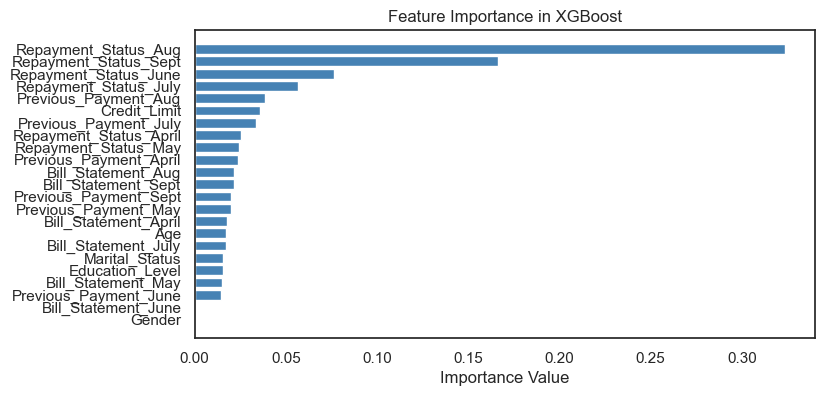

In [78]:
final_model = best_model_xgb
# Extract feature importances
feature_importance = final_model.feature_importances_

# Create a DataFrame for easier handling
coef_df = pd.DataFrame(feature_importance, index=X_train_scaled.columns, columns=['Importance'])

# Sort the feature importances for better visualization
coef_df = coef_df.sort_values(by='Importance', ascending=True)

# Plotting
plt.figure(figsize=(8, 4))
plt.barh(coef_df.index, coef_df['Importance'], color='steelblue')
plt.xlabel('Importance Value')
plt.title('Feature Importance in XGBoost')
plt.show()


### Save the Model

In [79]:
import os
from joblib import dump

# Create the directory if it doesn't exist
os.makedirs('artifacts', exist_ok=True)

# Save the model data
model_data = {
    'model': final_model,
    'features': X_train_scaled.columns,
    'scaler': scaler,
}

dump(model_data, 'artifacts/model_data.joblib')


['artifacts/model_data.joblib']